In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fifa-player-faces/data/207410.png
/kaggle/input/fifa-player-faces/data/188768.png
/kaggle/input/fifa-player-faces/data/240315.png
/kaggle/input/fifa-player-faces/data/212095.png
/kaggle/input/fifa-player-faces/data/235568.png
/kaggle/input/fifa-player-faces/data/223671.png
/kaggle/input/fifa-player-faces/data/238651.png
/kaggle/input/fifa-player-faces/data/251106.png
/kaggle/input/fifa-player-faces/data/244765.png
/kaggle/input/fifa-player-faces/data/211135.png
/kaggle/input/fifa-player-faces/data/247758.png
/kaggle/input/fifa-player-faces/data/234713.png
/kaggle/input/fifa-player-faces/data/245589.png
/kaggle/input/fifa-player-faces/data/259235.png
/kaggle/input/fifa-player-faces/data/259115.png
/kaggle/input/fifa-player-faces/data/259767.png
/kaggle/input/fifa-player-faces/data/49472.png
/kaggle/input/fifa-player-faces/data/221625.png
/kaggle/input/fifa-player-faces/data/236503.png
/kaggle/input/fifa-player-faces/data/257246.png
/kaggle/input/fifa-player-faces/data/2291

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import PIL
from tensorflow.keras import layers
from tensorflow.python.client import device_lib
import time
from IPython import display
from tqdm import tqdm
from tensorflow.keras import utils
import os
from sklearn.model_selection import GroupShuffleSplit
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization, Conv2DTranspose, LeakyReLU, Reshape, Activation
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
import cv2
import warnings
warnings.filterwarnings('ignore')

In [3]:
img_size = 128
batch_size = 64

datagen = ImageDataGenerator(rescale=1/255.)

data_generator = datagen.flow_from_directory(directory='/kaggle/input/fifa-player-faces/',
                                        target_size=(img_size,img_size),
                                        class_mode=None,
                                        batch_size=batch_size,
                                        shuffle=False)

samples = data_generator.samples

Found 27481 images belonging to 1 classes.


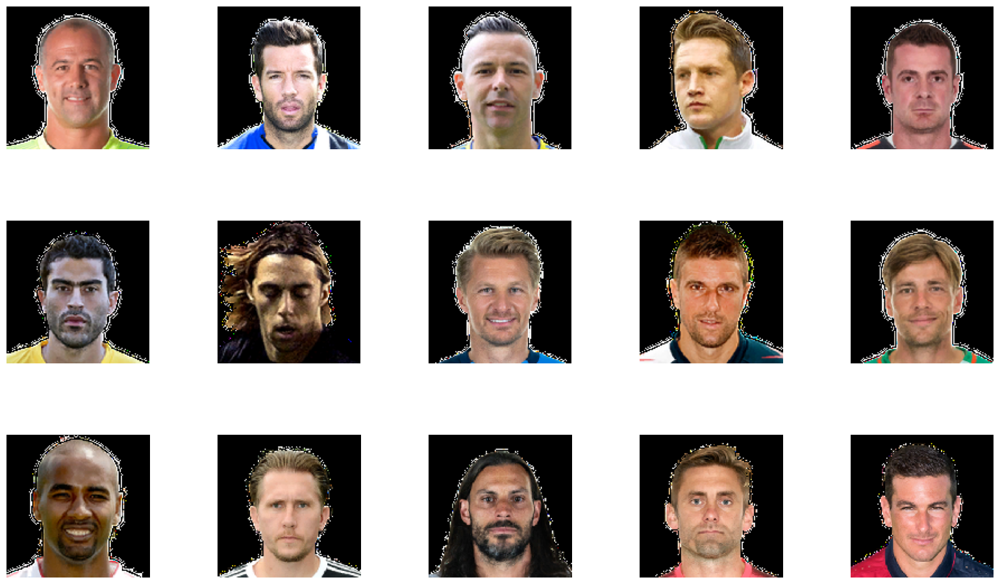

In [4]:
images = data_generator.__next__()

plt.figure(figsize = (20 , 20))
for i in range(15):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
    plt.imshow(images[i])
    plt.axis('off')

In [5]:
discriminator = Sequential(
    [
        Input(shape=(128, 128, 3)),
        Conv2D(64, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(alpha=0.2),
        Conv2D(128, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(0.2),
        Conv2D(128, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(0.2),
        Flatten(),
        Dropout(0.2),
        Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 flatten (Flatten)           (None, 32768)           

In [6]:
latent_dim = 128
generator = Sequential(
    [
        Input(shape=(latent_dim,)),
        Dense(16 * 16 * 128),
        Reshape((16, 16, 128)),
        Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(alpha=0.2),
        Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(alpha=0.2),
        Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"),
        LeakyReLU(alpha=0.2),
        Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator",
)
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 32768)             4227072   
                                                                 
 reshape (Reshape)           (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 32, 32, 128)      262272    
 nspose)                                                         
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 64, 64, 256)      524544    
 ranspose)                                                       
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 64, 64, 256)       0 

Epoch:  0


100%|██████████| 430/430 [08:04<00:00,  1.13s/it]


Epoch: 0 Generator Loss: 2.4258036613464355 Discriminator Loss: 0.4329327344894409


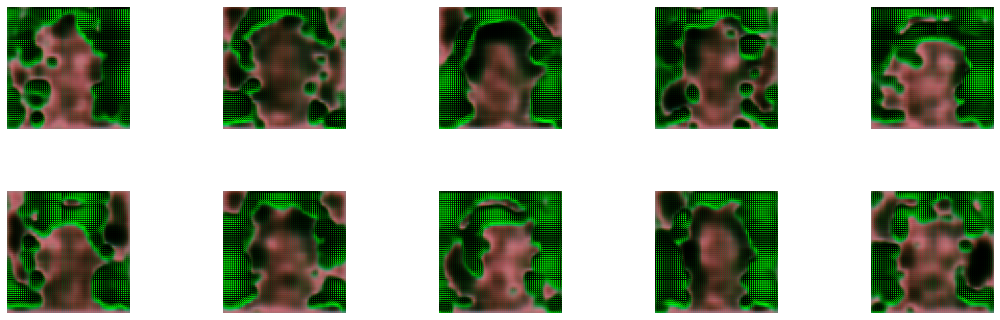

Epoch:  1


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 1 Generator Loss: 2.4548425674438477 Discriminator Loss: 0.35581594705581665


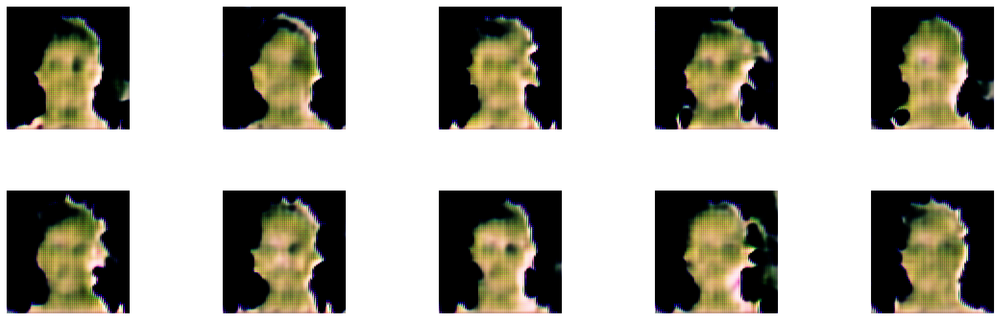

Epoch:  2


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 2 Generator Loss: 2.634411573410034 Discriminator Loss: 0.3253955841064453


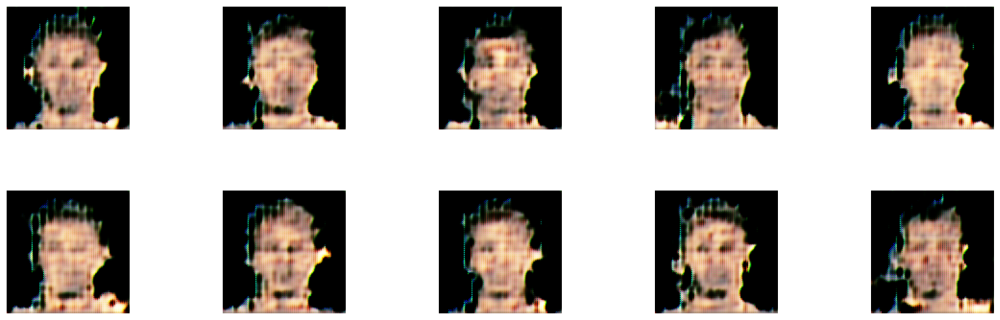

Epoch:  3


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 3 Generator Loss: 2.82820987701416 Discriminator Loss: 0.32567310333251953


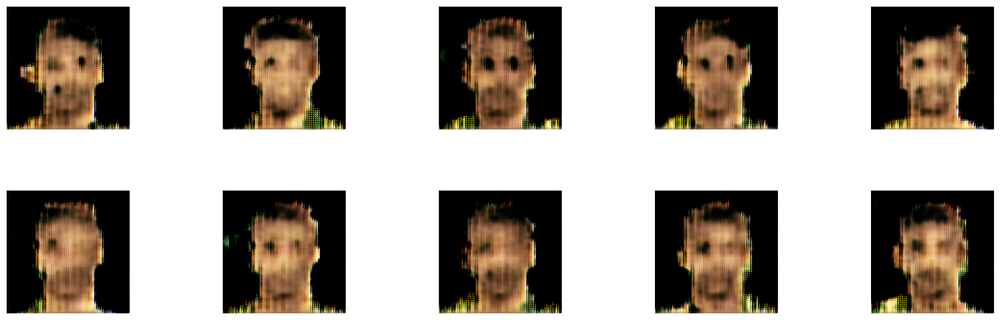

Epoch:  4


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 4 Generator Loss: 2.806673526763916 Discriminator Loss: 0.30339208245277405


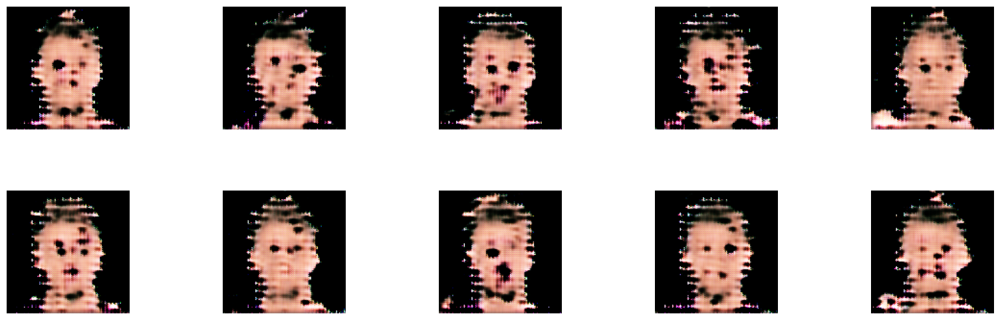

Epoch:  5


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 5 Generator Loss: 2.8162763118743896 Discriminator Loss: 0.2896302044391632


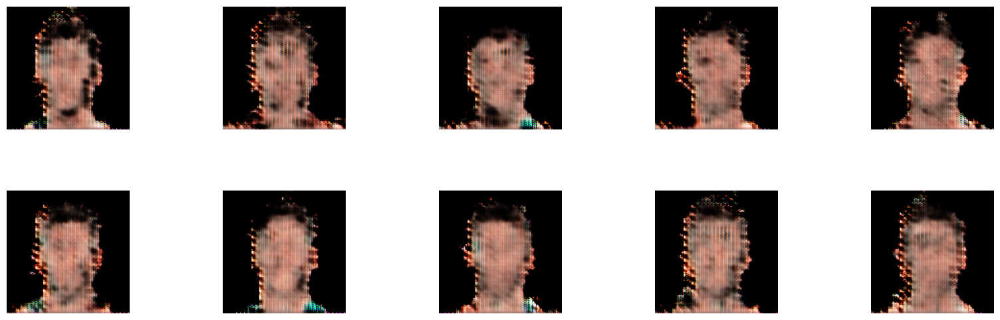

Epoch:  6


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 6 Generator Loss: 2.8520724773406982 Discriminator Loss: 0.2897733449935913


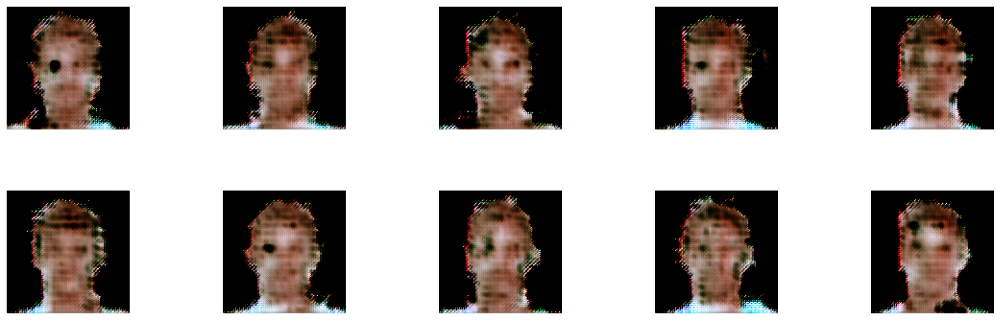

Epoch:  7


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 7 Generator Loss: 2.878051280975342 Discriminator Loss: 0.2976939380168915


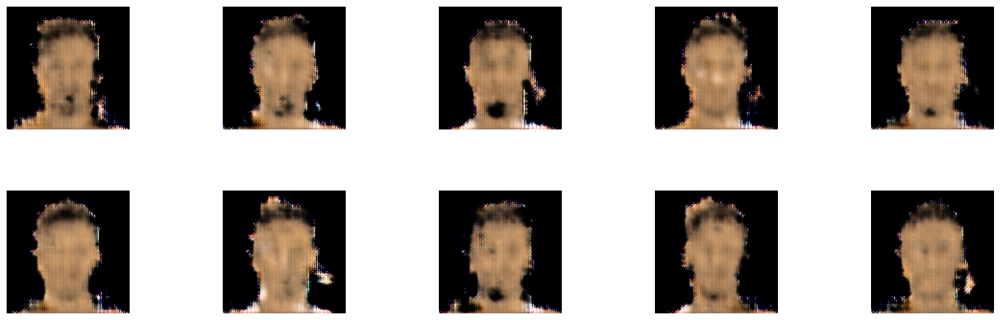

Epoch:  8


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 8 Generator Loss: 2.8372933864593506 Discriminator Loss: 0.29923123121261597


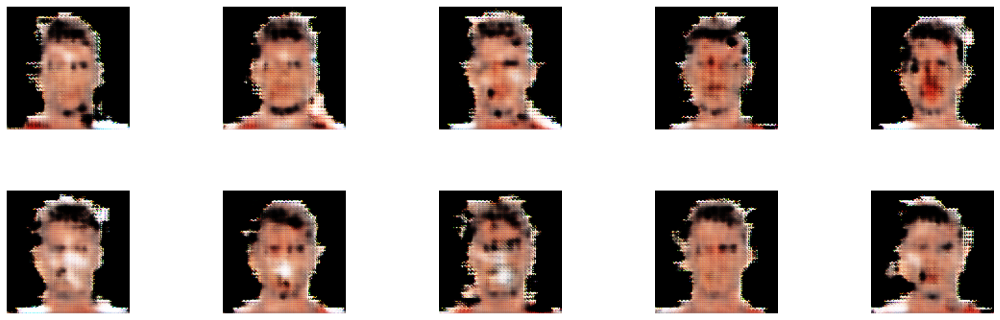

Epoch:  9


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 9 Generator Loss: 2.792494773864746 Discriminator Loss: 0.3045297861099243


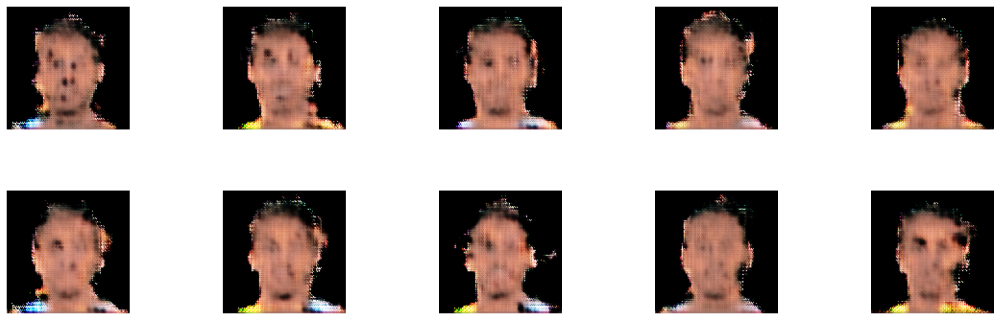

Epoch:  10


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 10 Generator Loss: 2.7602105140686035 Discriminator Loss: 0.30296939611434937


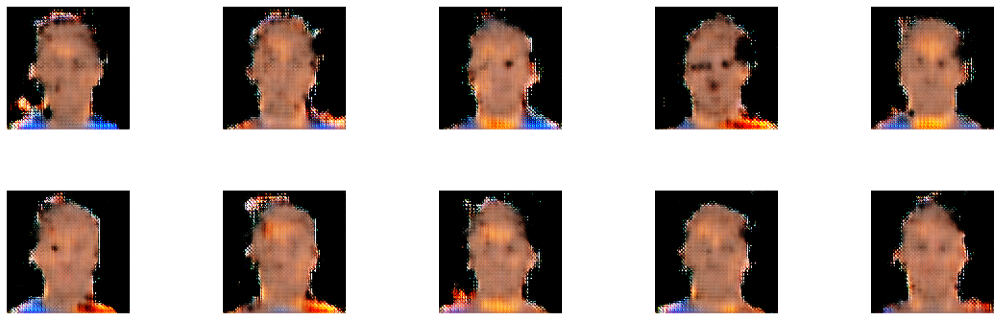

Epoch:  11


100%|██████████| 430/430 [07:25<00:00,  1.03s/it]


Epoch: 11 Generator Loss: 2.7456774711608887 Discriminator Loss: 0.2995583415031433


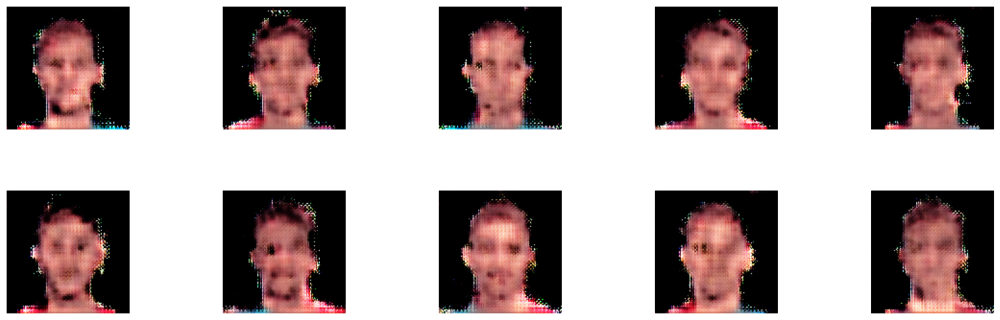

Epoch:  12


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 12 Generator Loss: 2.737485647201538 Discriminator Loss: 0.29650187492370605


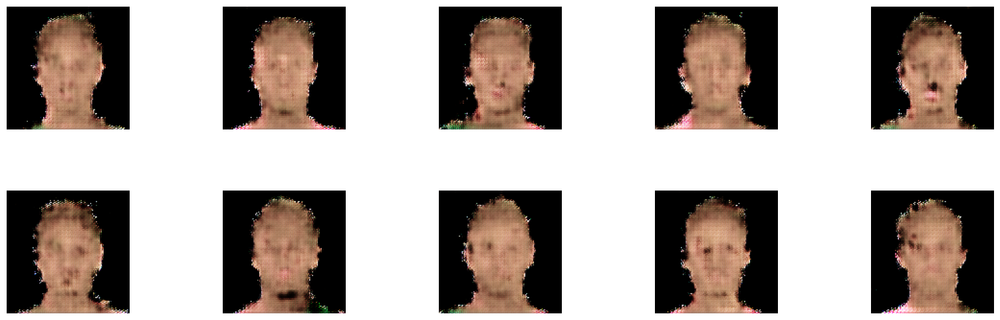

Epoch:  13


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 13 Generator Loss: 2.74697208404541 Discriminator Loss: 0.2915979027748108


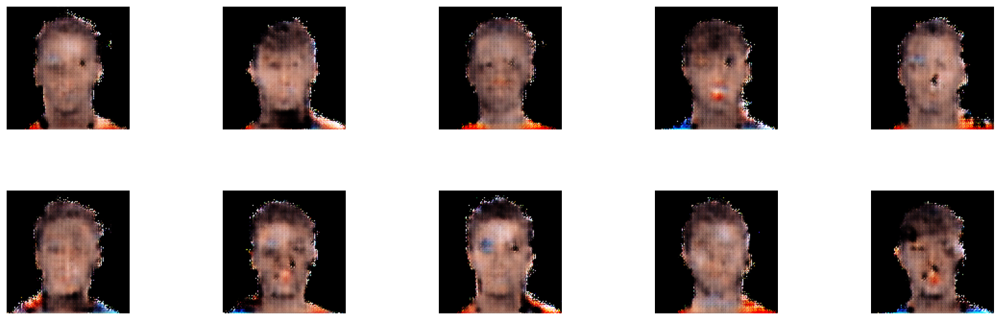

Epoch:  14


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 14 Generator Loss: 2.764975070953369 Discriminator Loss: 0.29031774401664734


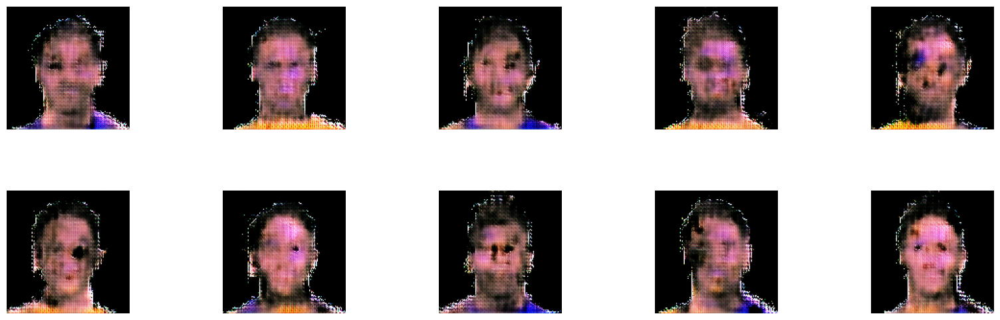

Epoch:  15


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 15 Generator Loss: 2.77607798576355 Discriminator Loss: 0.28987401723861694


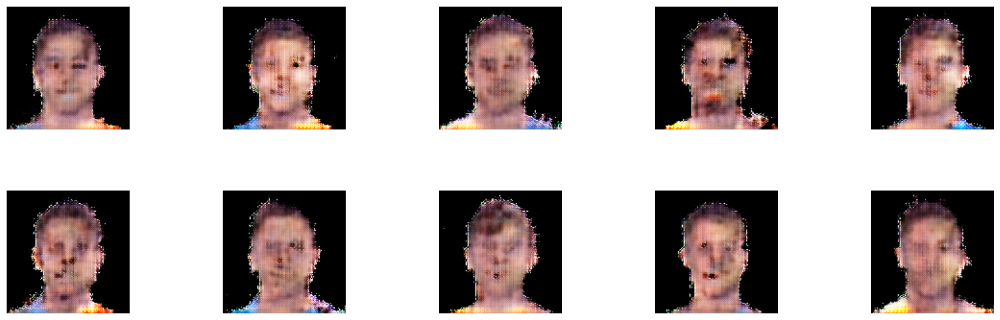

Epoch:  16


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 16 Generator Loss: 2.7773990631103516 Discriminator Loss: 0.287133127450943


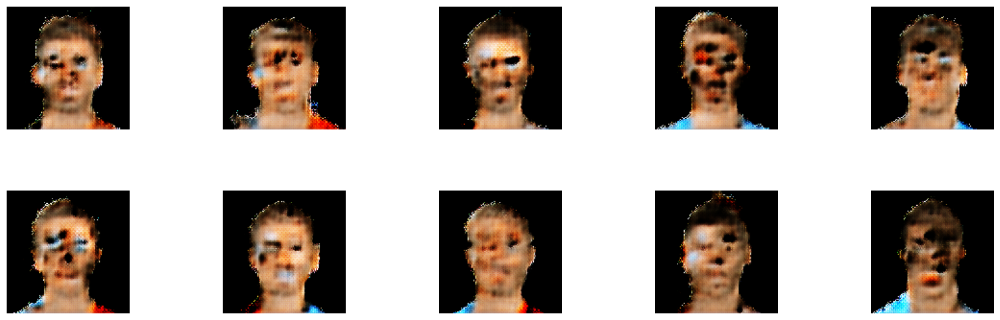

Epoch:  17


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 17 Generator Loss: 2.772191047668457 Discriminator Loss: 0.2872147560119629


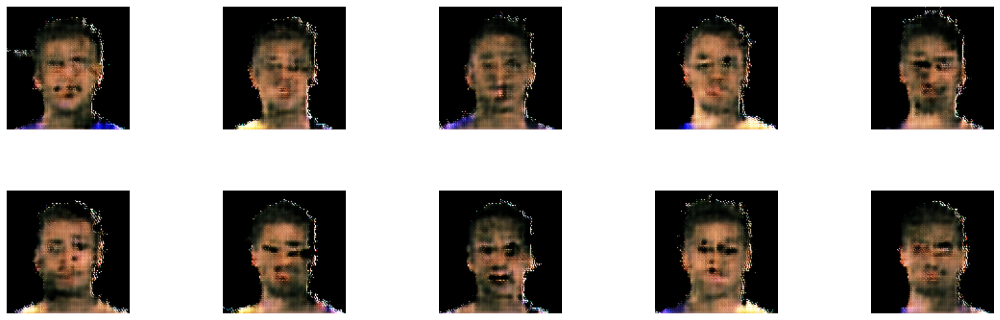

Epoch:  18


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 18 Generator Loss: 2.7880823612213135 Discriminator Loss: 0.2873933017253876


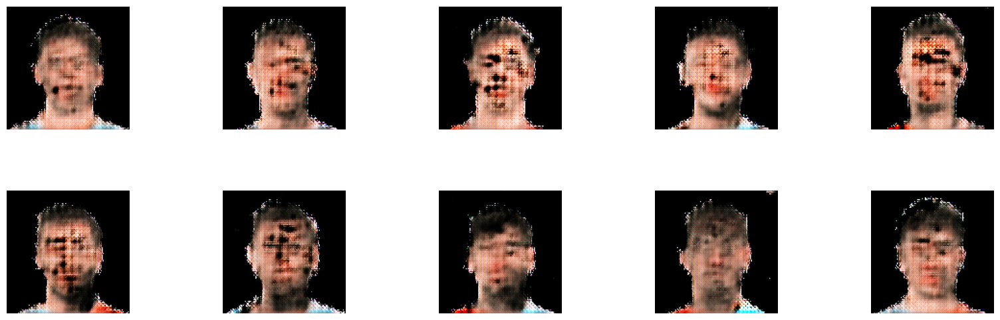

Epoch:  19


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 19 Generator Loss: 2.787823438644409 Discriminator Loss: 0.28580671548843384


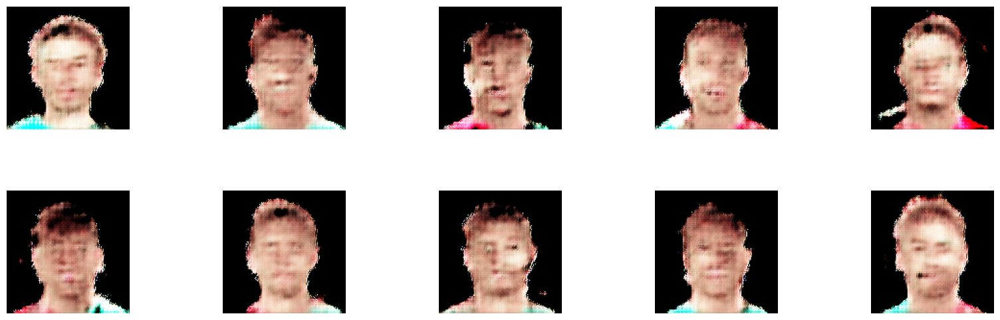

Epoch:  20


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 20 Generator Loss: 2.789198637008667 Discriminator Loss: 0.2865928113460541


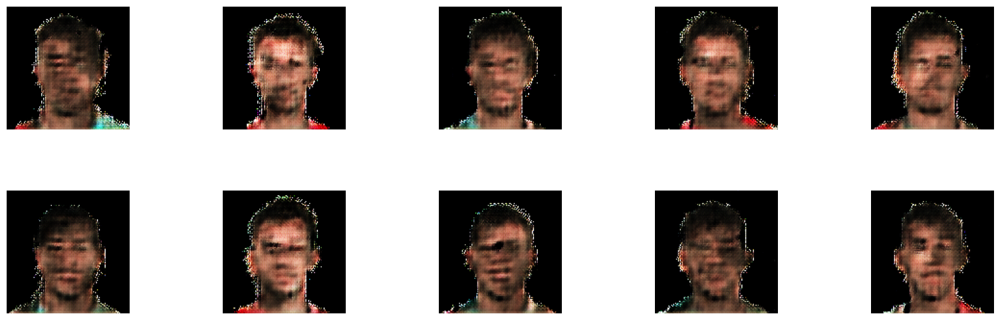

Epoch:  21


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 21 Generator Loss: 2.7862815856933594 Discriminator Loss: 0.2871783971786499


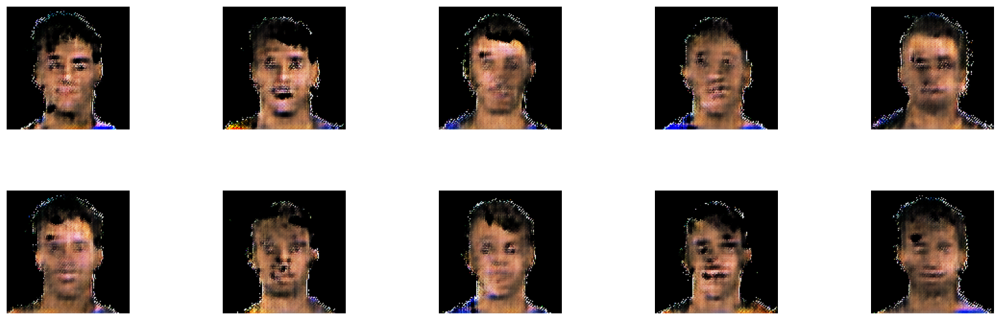

Epoch:  22


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 22 Generator Loss: 2.7839179039001465 Discriminator Loss: 0.28729864954948425


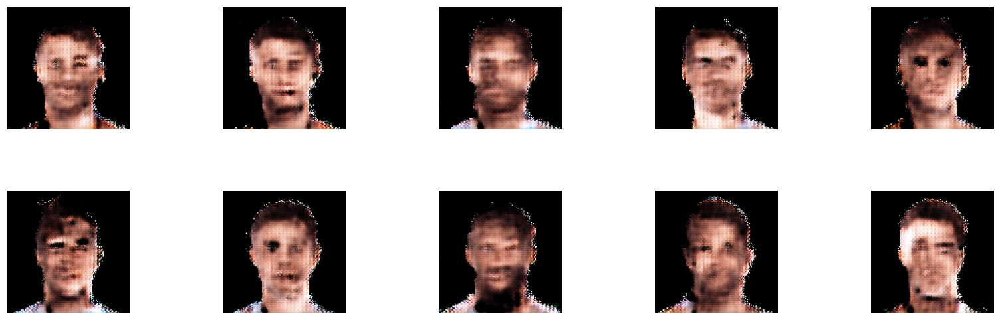

Epoch:  23


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 23 Generator Loss: 2.784085512161255 Discriminator Loss: 0.28756657242774963


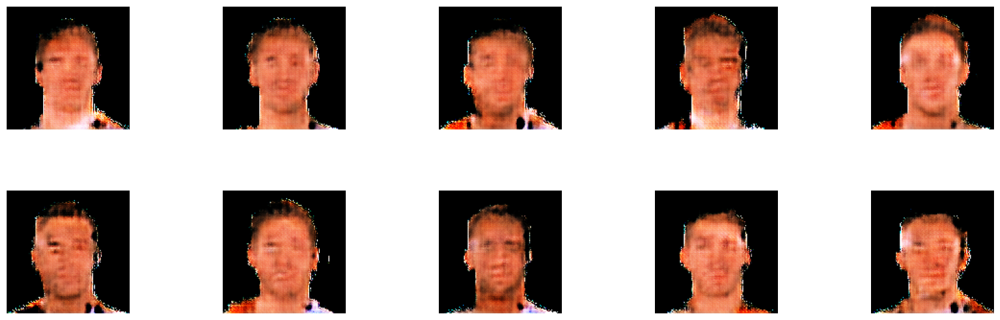

Epoch:  24


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 24 Generator Loss: 2.781599283218384 Discriminator Loss: 0.28766632080078125


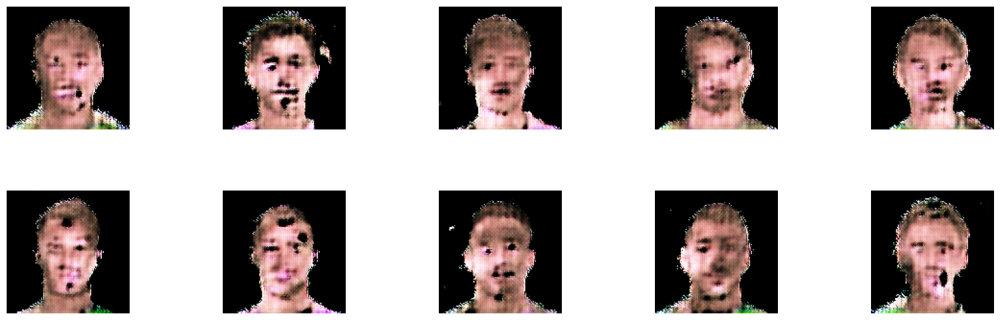

Epoch:  25


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 25 Generator Loss: 2.772937059402466 Discriminator Loss: 0.2871280312538147


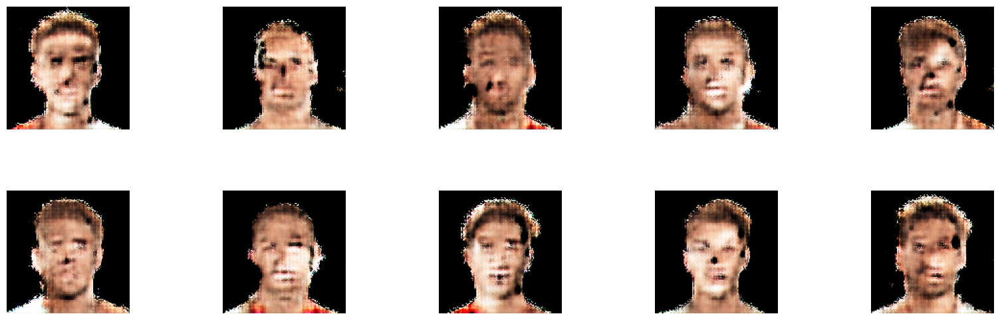

Epoch:  26


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 26 Generator Loss: 2.761512279510498 Discriminator Loss: 0.28730878233909607


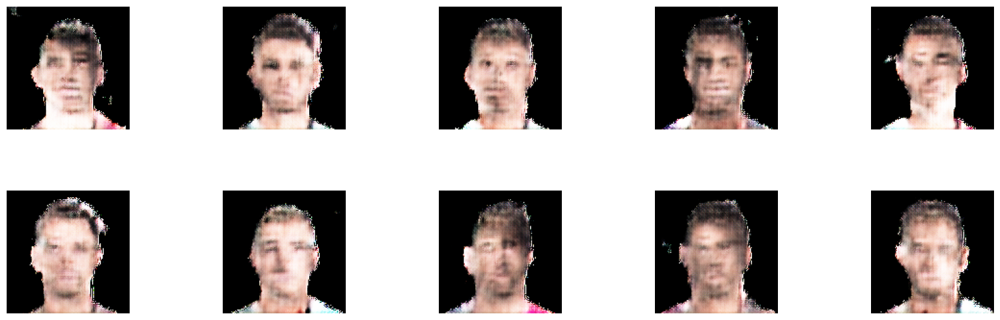

Epoch:  27


100%|██████████| 430/430 [07:24<00:00,  1.03s/it]


Epoch: 27 Generator Loss: 2.7607996463775635 Discriminator Loss: 0.28735488653182983


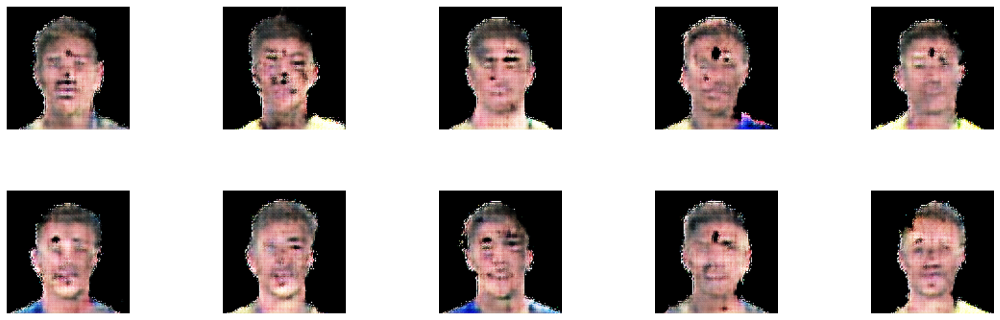

Epoch:  28


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 28 Generator Loss: 2.7580862045288086 Discriminator Loss: 0.2867922782897949


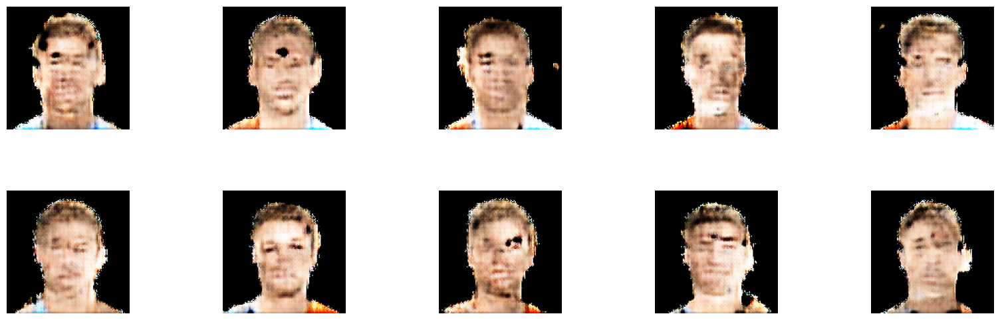

Epoch:  29


100%|██████████| 430/430 [07:25<00:00,  1.04s/it]


Epoch: 29 Generator Loss: 2.7593226432800293 Discriminator Loss: 0.2860736548900604


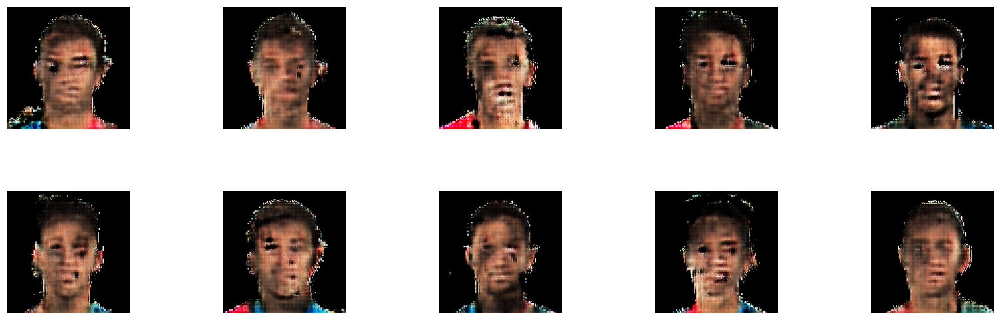

In [7]:
gen_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
dis_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
loss_fn = tf.keras.losses.BinaryCrossentropy()
epochs=30
steps_per_epoch = int(-(samples/-batch_size))

disc_losses = []
gen_losses = []

for epoch in range(epochs):
    print("Epoch: ",epoch)
    for idx, (real) in enumerate(tqdm(data_generator)):
        if idx > steps_per_epoch:
            break
        
        batch_size = real.shape[0]
        random_latent_vectors = tf.random.normal(shape = (batch_size, latent_dim))
        fake = generator(random_latent_vectors)

        with tf.GradientTape() as d_tape:
            loss_disc_real = loss_fn(tf.ones((batch_size, 1)), discriminator(real))
            loss_disc_fake = loss_fn(tf.zeros((batch_size, 1)), discriminator(fake))
            loss_disc = (loss_disc_real + loss_disc_fake)/2
            disc_losses.append(loss_disc)

        grads = d_tape.gradient(loss_disc, discriminator.trainable_weights)
        dis_optimizer.apply_gradients(zip(grads, discriminator.trainable_weights))

        with tf.GradientTape() as g_tape:
            fake = generator(random_latent_vectors)
            output = discriminator(fake)
            loss_gen = loss_fn(tf.ones(batch_size, 1), output)
            gen_losses.append(loss_gen)

        grads = g_tape.gradient(loss_gen, generator.trainable_weights)
        gen_optimizer.apply_gradients(zip(grads, generator.trainable_weights))
    
    mean_disc_loss = sum(disc_losses)/len(disc_losses)
    mean_gen_loss = sum(gen_losses)/len(gen_losses)
    
    print(f"Epoch: {epoch} Generator Loss: {mean_gen_loss} Discriminator Loss: {mean_disc_loss}")
    data_generator.on_epoch_end()
    
    random_latent_vectors = tf.random.normal(shape = (10, latent_dim))
    fake = generator(random_latent_vectors)
    generated_images = fake.numpy()
    plt.figure(figsize = (20 , 6))
    for i in range(10):
        plt.subplot(2 , 5, i+1)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = generated_images[i]
        plt.imshow(image)
        plt.axis('off')
    plt.show()